In [1]:
!pip install -r requirements.txt
import lightgbm as lgb
import pandas as pd
import numpy as np
from datetime import date, timedelta,datetime
import holidays
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_datareader as pdr
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from google.cloud import bigquery
from google.oauth2 import service_account
from tslearn.clustering import KShape
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.metrics import cdist_dtw
import requests
import os
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.preprocessing import StandardScaler
from tslearn.clustering import TimeSeriesKMeans
from tslearn.utils import to_time_series_dataset
from tslearn.barycenters import dtw_barycenter_averaging
import matplotlib.pyplot as plt
import seaborn as sns

  Using cached lightgbm-3.3.2-py3-none-manylinux1_x86_64.whl (2.0 MB)
  Obtaining dependency information for holidays from https://files.pythonhosted.org/packages/bd/77/3fa00dd747dfa9f1d89d53c60484eb3cbb5d32c94f57aecc64e0209e8e29/holidays-0.39-py3-none-any.whl.metadata
  Using cached holidays-0.39-py3-none-any.whl.metadata (21 kB)
  Using cached pandas_datareader-0.10.0-py3-none-any.whl (109 kB)
  Obtaining dependency information for tslearn from https://files.pythonhosted.org/packages/97/22/8dba9a7149d51fe0b6163a5a6b7efc315ab3c097cb6b0d1fc649a03f2722/tslearn-0.6.3-py3-none-any.whl.metadata
  Using cached tslearn-0.6.3-py3-none-any.whl.metadata (14 kB)
  Obtaining dependency information for category_encoders from https://files.pythonhosted.org/packages/7f/e5/79a62e5c9c9ddbfa9ff5222240d408c1eeea4e38741a0dc8343edc7ef1ec/category_encoders-2.6.3-py2.py3-none-any.whl.metadata
  Using cached category_encoders-2.6.3-py2.py3-none-any.whl.metadata (8.0 kB)
  Obtaining dependency information for

/opt/conda/lib/python3.10/site-packages/tslearn/bases/bases.py:15: UserWarning: h5py not installed, hdf5 features will not be supported.
Install h5py to use hdf5 features: http://docs.h5py.org/
  warn(h5py_msg)


In [2]:
df = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
target = pd.read_csv('target.csv')

def category(df):
    for col in df.columns:
        if df[col].dtype == 'object':
            df[col] = df[col].astype('category')
    return df
def zero_process(df):
    temp_target = target.copy()
    temp_target.drop(columns=['product_ProductName','mean_used_num'], inplace=True)
    temp_target['date'] = ''
    concatenated_df = pd.DataFrame()
    for date in df['date'].unique():
        temp_target['date'] = date
        concatenated_df = pd.concat([concatenated_df, temp_target], axis=0)
    df = pd.concat([df, concatenated_df]).sort_values(by='date')
    df.fillna({'lineItem_UsageAccountId': 0, 'sum_num_machine': 0}, inplace=True)
    df.reset_index(drop=True)
    return df

def get_test(df):
    df = zero_process(df)
    df.drop(['lineItem_UsageAccountId','sum_num_machine'],axis=1,inplace=True)
    df = df.drop_duplicates(subset=['date', 'customer','product_region','product_operatingSystem','product_instanceType'])
    df = df.merge(target, left_on=['customer', 'product_region', 'product_operatingSystem','product_instanceType'], right_on=['customer', 'product_region', 'product_operatingSystem','product_instanceType'])
    df.drop(['product_ProductName','mean_used_num'],axis=1,inplace=True)    

    df['date'] = pd.to_datetime(df['date'])
    df['year'] = df['date'].dt.year
    df['month'] = df['date'].dt.month
    df['day'] = df['date'].dt.day
    
    country_holidays = holidays.CountryHoliday('JP')
    df['weekday'] = None

    for index, row in df.iterrows():
        current_date = pd.to_datetime(row['date'])
        df.at[index, 'weekday'] = current_date.strftime("%A")
    df=category(df)
    #df.drop('date',axis=1,inplace=True)
    return df
    
def get_train(df):
    df = zero_process(df)
    df.drop('lineItem_UsageAccountId', axis=1, inplace=True)
    df['total_sum_num_machine'] = df.groupby(['date', 'customer','product_region','product_operatingSystem','product_instanceType'])['sum_num_machine'].transform('sum')
    df = df.drop_duplicates(subset=['date', 'customer','product_region','product_operatingSystem','product_instanceType'])
    df = df.merge(target, left_on=['customer', 'product_region', 'product_operatingSystem','product_instanceType'], right_on=['customer', 'product_region', 'product_operatingSystem','product_instanceType'])
    df.drop(['product_ProductName','mean_used_num','sum_num_machine'],axis=1,inplace=True)
    df['date'] = pd.to_datetime(df['date'])
    df['year'] = df['date'].dt.year
    df['month'] = df['date'].dt.month
    df['day'] = df['date'].dt.day
    
    country_holidays = holidays.CountryHoliday('JP')
    df['weekday'] = None

    for index, row in df.iterrows():
        current_date = pd.to_datetime(row['date'])
        df.at[index, 'weekday'] = current_date.strftime("%A")
    df=category(df)
    #df.drop('date',axis=1,inplace=True)
    
    return df

df = get_train(df)
test = get_test(test)

In [3]:
dfc = df.copy()

dfc['instance'] = df.apply(
    lambda row: "{customer}, {region}, {os}, {type}".format(
        customer=row['customer'],
        region=row['product_region'],
        os=row['product_operatingSystem'],
        type=row['product_instanceType']
    ), axis=1)

dfc['month-day'] = dfc.apply(lambda row: f"{row['month']}-{row['day']}", axis=1)

In [4]:
columns=['instance','customer','product_region','product_instanceType','product_operatingSystem']

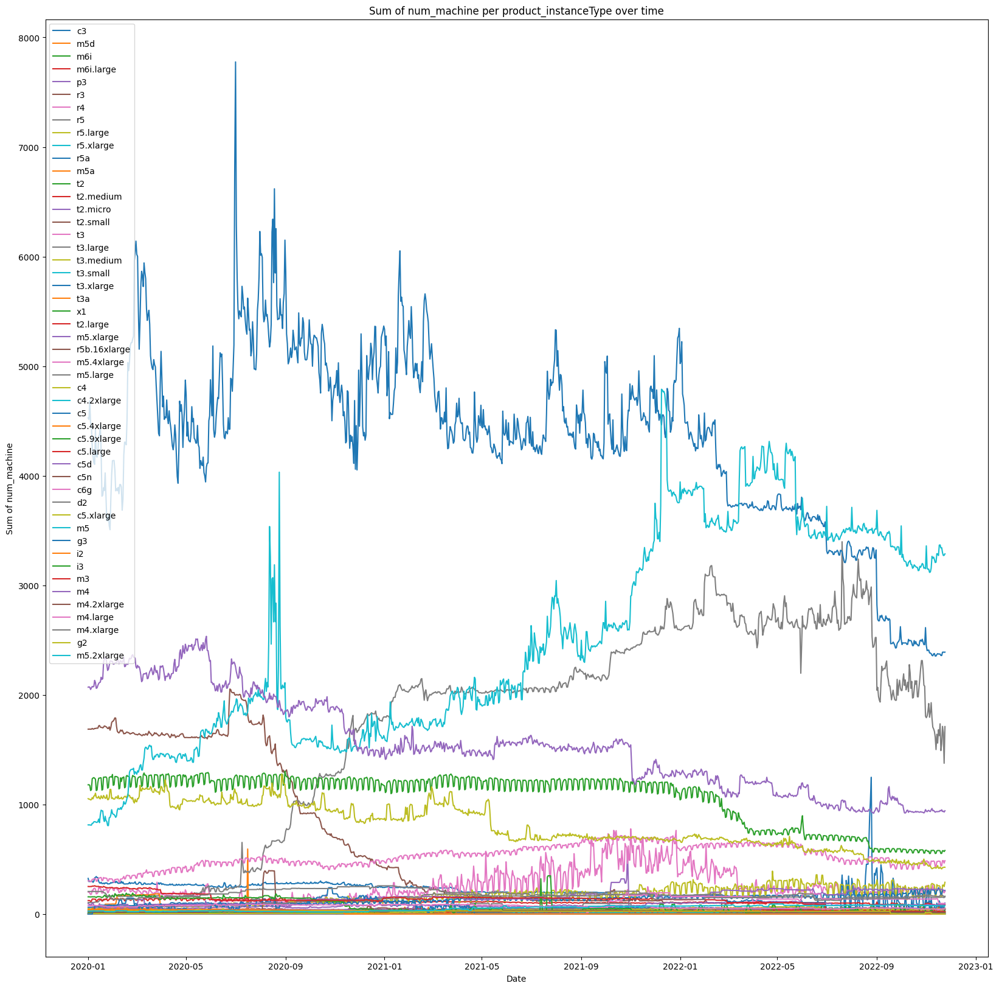

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
grouped_df = df.groupby(['date', 'product_instanceType'])['total_sum_num_machine'].sum().reset_index()

grouped_df['date'] = pd.to_datetime(grouped_df['date'])


grouped_df = grouped_df.sort_values('date')

fig, ax = plt.subplots(figsize=(20, 20))
for instance_type in grouped_df['product_instanceType'].unique():
    instance_df = grouped_df[grouped_df['product_instanceType'] == instance_type]
    ax.plot(instance_df['date'], instance_df['total_sum_num_machine'], label=instance_type)

ax.set_title('Sum of num_machine per product_instanceType over time')
ax.set_xlabel('Date')
ax.set_ylabel('Sum of num_machine')

ax.legend()

plt.show()

## 各特徴量毎の割合

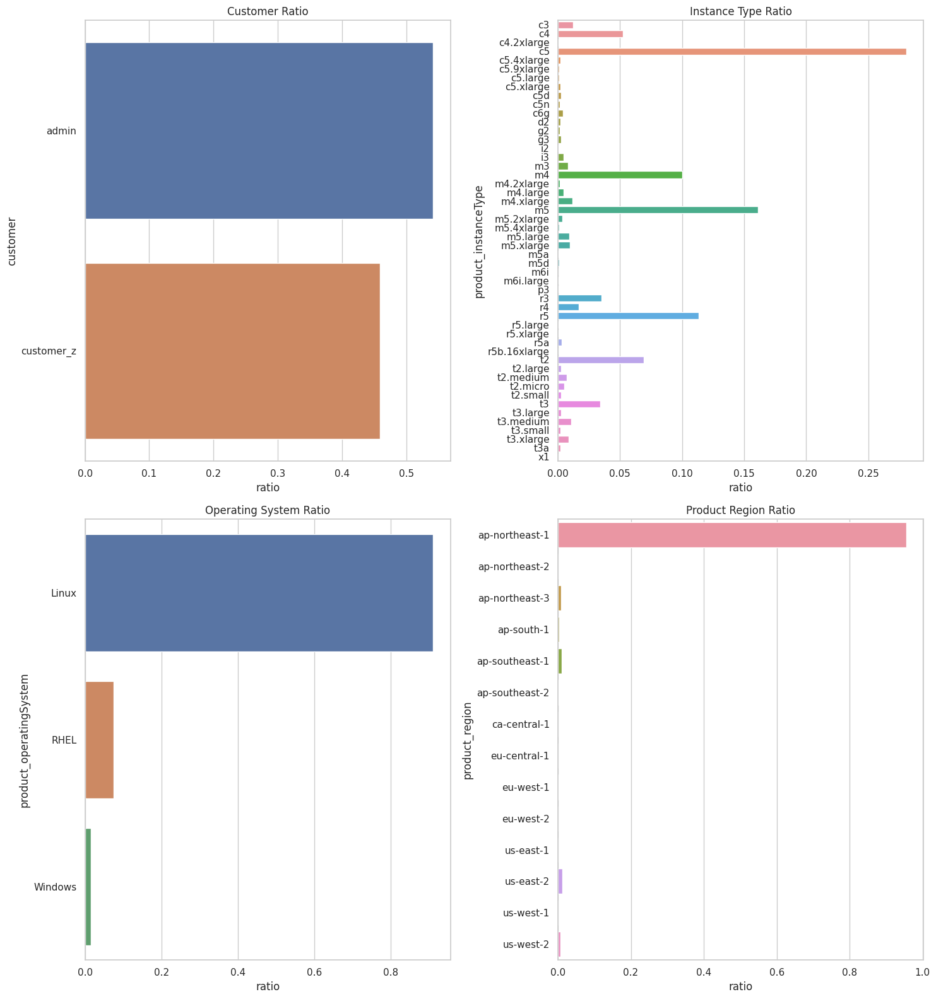

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# 全体の合計値
total_sum = df['total_sum_num_machine'].sum()

# 各グループの合計値と比率を計算
customer_sum = df.groupby('customer')['total_sum_num_machine'].sum().reset_index()
customer_sum['ratio'] = customer_sum['total_sum_num_machine'] / total_sum
customer_sum.sort_values(by='ratio', ascending=False, inplace=True)

instanceType_sum = df.groupby('product_instanceType')['total_sum_num_machine'].sum().reset_index()
instanceType_sum['ratio'] = instanceType_sum['total_sum_num_machine'] / total_sum
instanceType_sum.sort_values(by='ratio', ascending=False, inplace=True)

operatingSystem_sum = df.groupby('product_operatingSystem')['total_sum_num_machine'].sum().reset_index()
operatingSystem_sum['ratio'] = operatingSystem_sum['total_sum_num_machine'] / total_sum
operatingSystem_sum.sort_values(by='ratio', ascending=False, inplace=True)

product_region_sum = df.groupby('product_region')['total_sum_num_machine'].sum().reset_index()
product_region_sum['ratio'] = product_region_sum['total_sum_num_machine'] / total_sum
product_region_sum.sort_values(by='ratio', ascending=False, inplace=True)


sns.set(style="whitegrid")
plt.figure(figsize=(15, 16))

plt.subplot(2, 2, 1)
sns.barplot(x='ratio', y='customer', data=customer_sum, orient='h')
plt.title('Customer Ratio')

plt.subplot(2, 2, 2)
sns.barplot(x='ratio', y='product_instanceType', data=instanceType_sum, orient='h')
plt.title('Instance Type Ratio')

plt.subplot(2, 2, 3)
sns.barplot(x='ratio', y='product_operatingSystem', data=operatingSystem_sum, orient='h')
plt.title('Operating System Ratio')

plt.subplot(2, 2, 4)
sns.barplot(x='ratio', y='product_region', data=product_region_sum, orient='h')
plt.title('Product Region Ratio')

plt.tight_layout()
plt.show()

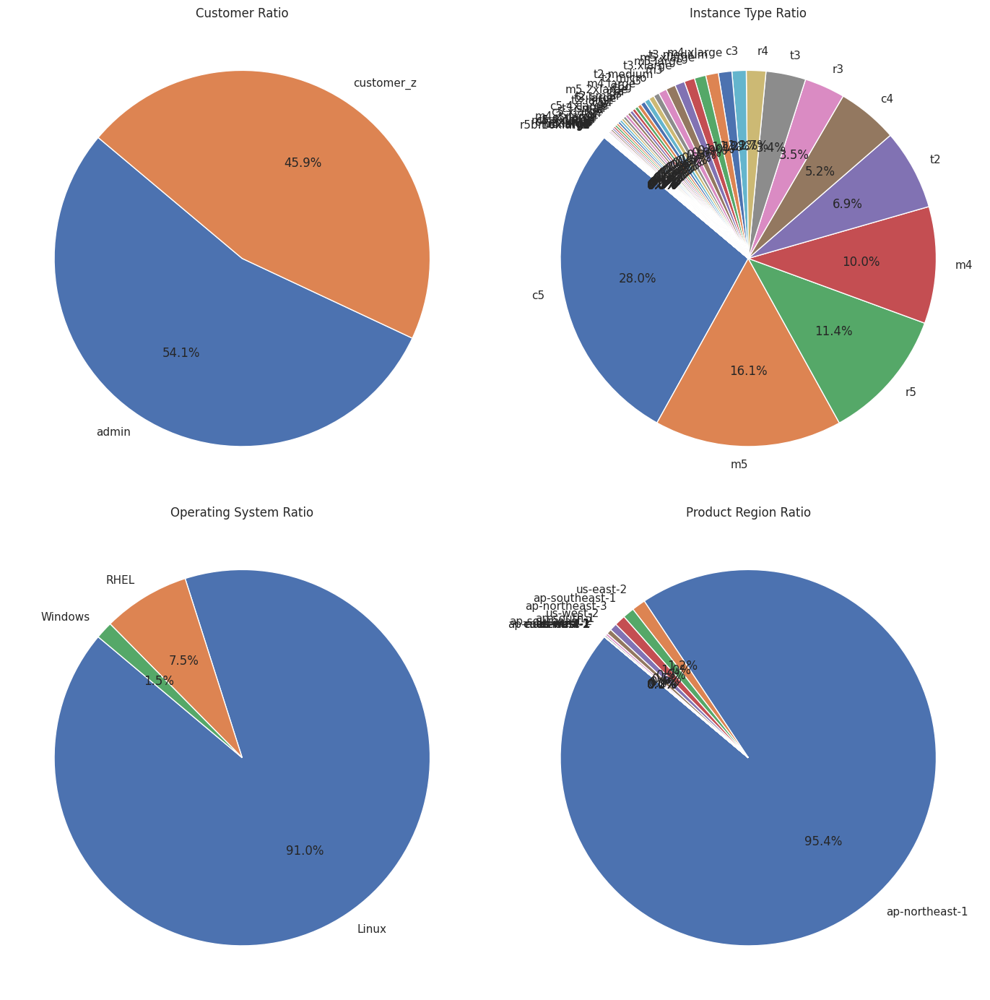

In [7]:
# スタイルの設定
sns.set(style="whitegrid")

# フィギュアの初期設定
plt.figure(figsize=(14, 14))

# 1つ目の円グラフ
plt.subplot(2, 2, 1)
plt.pie(customer_sum['ratio'], labels=customer_sum['customer'], autopct='%1.1f%%', startangle=140)
plt.title('Customer Ratio')

# 2つ目の円グラフ
plt.subplot(2, 2, 2)
plt.pie(instanceType_sum['ratio'], labels=instanceType_sum['product_instanceType'], autopct='%1.1f%%', startangle=140)
plt.title('Instance Type Ratio')

# 3つ目の円グラフ
plt.subplot(2, 2, 3)
plt.pie(operatingSystem_sum['ratio'], labels=operatingSystem_sum['product_operatingSystem'], autopct='%1.1f%%', startangle=140)
plt.title('Operating System Ratio')

# 4つ目の円グラフ
plt.subplot(2, 2, 4)
plt.pie(product_region_sum['ratio'], labels=product_region_sum['product_region'], autopct='%1.1f%%', startangle=140)
plt.title('Product Region Ratio')

# レイアウトの調整
plt.tight_layout()
plt.show()


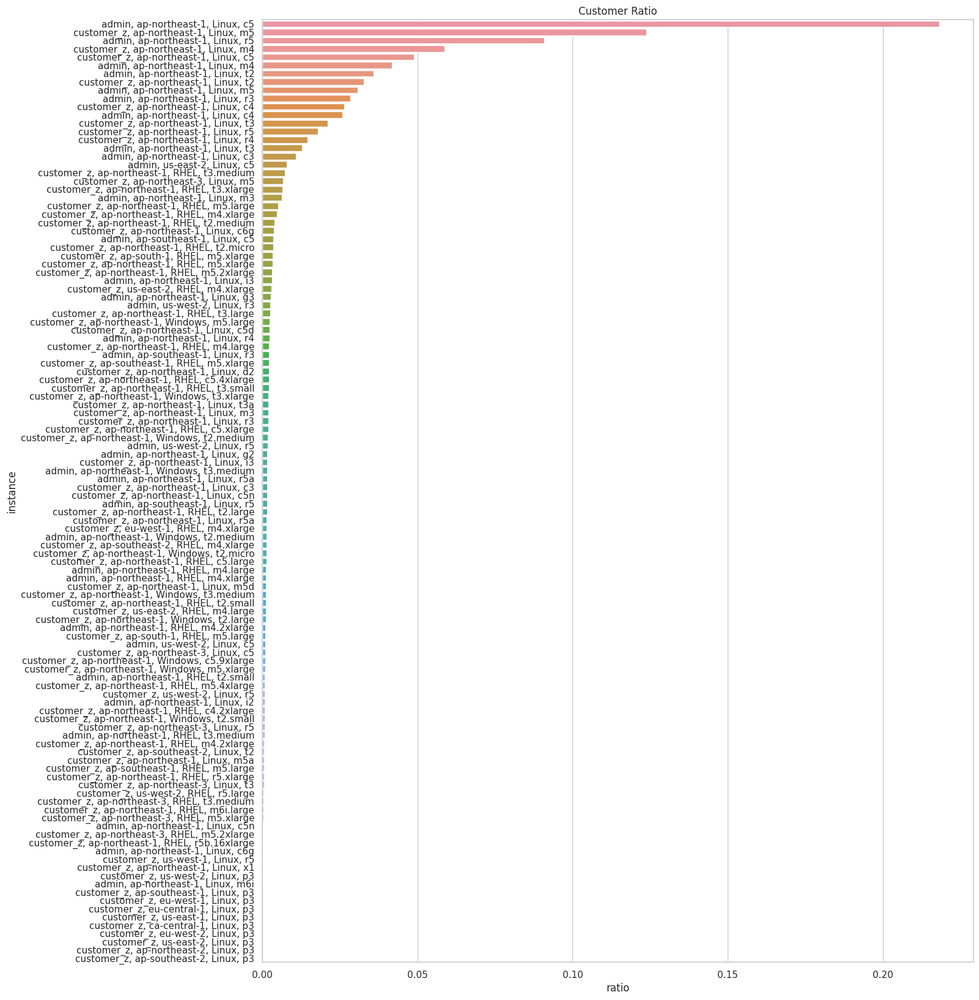

In [8]:
dfa = dfc[['date','instance','total_sum_num_machine']]
dfa_grouped = dfa.groupby('instance')['total_sum_num_machine'].sum().reset_index()
dfa_grouped['ratio'] = dfa_grouped['total_sum_num_machine'] / total_sum
dfa_grouped.sort_values(by='ratio', ascending=False, inplace=True)
sns.set(style="whitegrid")
plt.figure(figsize=(15, 20))

plt.plot()
sns.barplot(x='ratio', y='instance', data=dfa_grouped, orient='h')
plt.title('Customer Ratio')
plt.show()

## 曜日毎の割合

In [9]:
def plot_weekday_ratio(df, column):
    instance_column = df.groupby([column, 'weekday'])['total_sum_num_machine'].sum().reset_index()
    instance_sum = df.groupby(column)['total_sum_num_machine'].sum().reset_index()
    instance_column = instance_column.merge(instance_sum, on=column, suffixes=('', '_total'))
    instance_column['ratio'] = 100 * instance_column['total_sum_num_machine'] / instance_column['total_sum_num_machine_total']
    
    instances = instance_column[column].unique()
    n_rows = len(instances) // 3 + (len(instances) % 3 > 0)
    fig, axs = plt.subplots(n_rows, 3, figsize=(20, n_rows * 3), squeeze=False)

    for i, instance in enumerate(instances):
        row = i // 3
        col = i % 3
        ax = axs[row, col]

        instance_data = instance_column[instance_column[column] == instance]

        sns.barplot(x='weekday', y='ratio', data=instance_data, ax=ax)
        ax.set_title(instance)
        ax.set_xlabel('Weekday')
        ax.set_ylabel('Ratio (%)')

    for i in range(len(instances), n_rows * 3):
        axs[i // 3, i % 3].axis('off')

    plt.tight_layout()
    plt.show()


 
---------------------instance---------------------


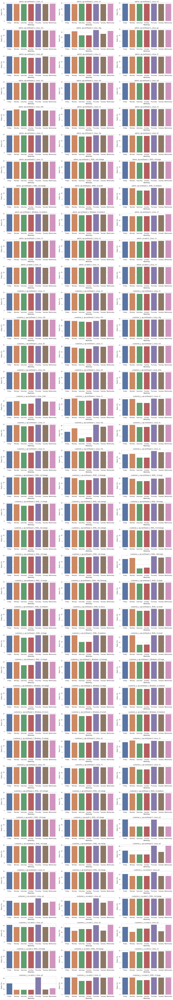

 
---------------------customer---------------------


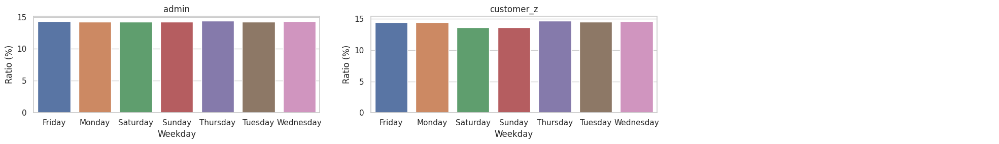

 
---------------------product_region---------------------


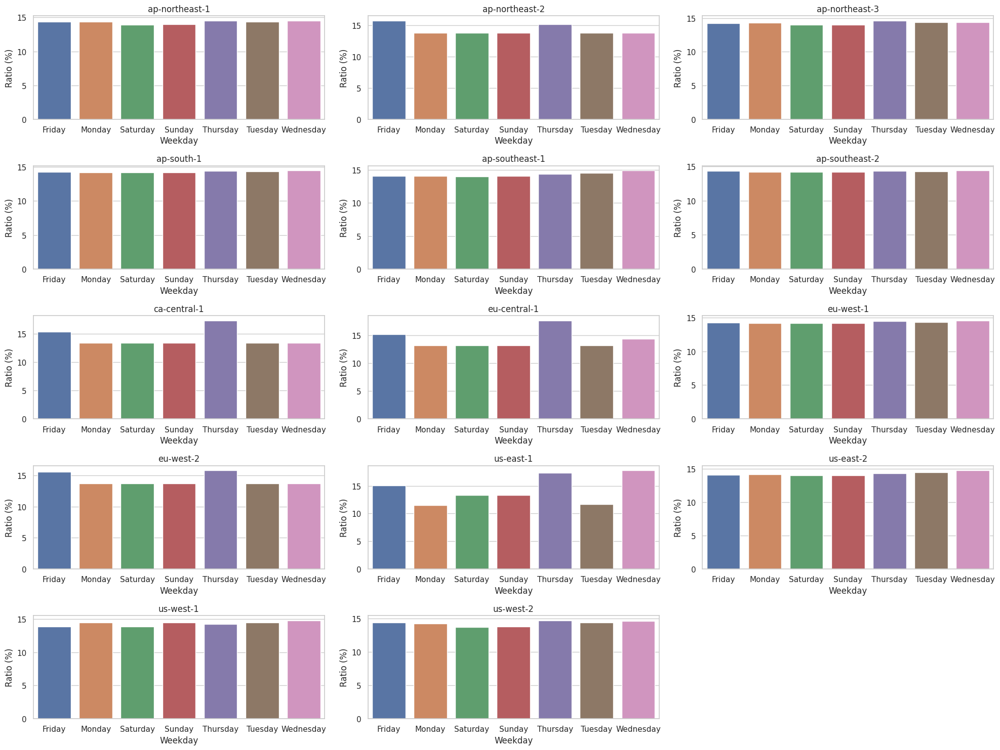

 
---------------------product_instanceType---------------------


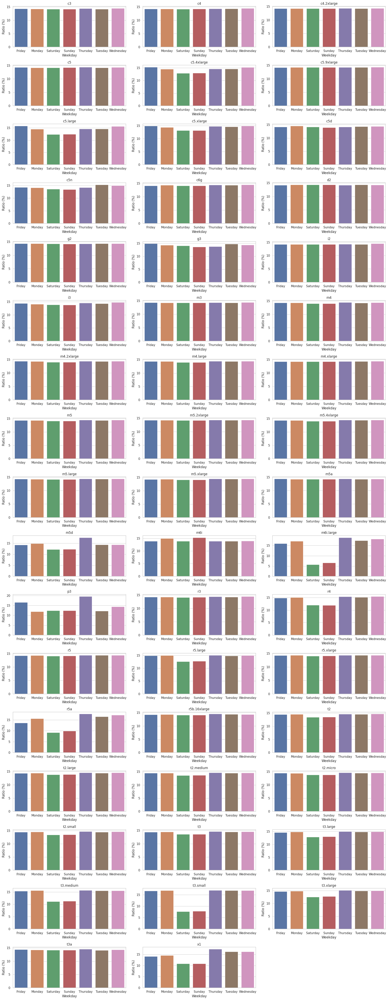

 
---------------------product_operatingSystem---------------------


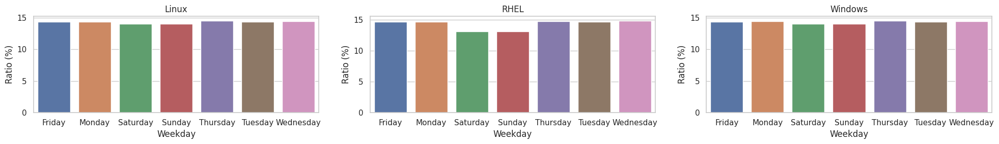

In [10]:
for column in columns:
    print(' ')
    print(f'---------------------{column}---------------------')
    plot_weekday_ratio(dfc,column)

# month毎

In [11]:
def plot_month_ratio(df, column):
    instance_column = df.groupby([column, 'month'])['total_sum_num_machine'].sum().reset_index()
    instance_sum = df.groupby(column)['total_sum_num_machine'].sum().reset_index()
    instance_column = instance_column.merge(instance_sum, on=column, suffixes=('', '_total'))
    instance_column['ratio'] = 100 * instance_column['total_sum_num_machine'] / instance_column['total_sum_num_machine_total']
    
    instances = instance_column[column].unique()
    n_rows = len(instances) // 3 + (len(instances) % 3 > 0)
    fig, axs = plt.subplots(n_rows, 3, figsize=(20, n_rows * 3), squeeze=False)

    for i, instance in enumerate(instances):
        row = i // 3
        col = i % 3
        ax = axs[row, col]

        instance_data = instance_column[instance_column[column] == instance]

        sns.barplot(x='month', y='ratio', data=instance_data, ax=ax)
        ax.set_title(instance)
        ax.set_xlabel('month')
        ax.set_ylabel('Ratio (%)')

    for i in range(len(instances), n_rows * 3):
        axs[i // 3, i % 3].axis('off')

    plt.tight_layout()
    plt.show()


 
---------------------instance---------------------


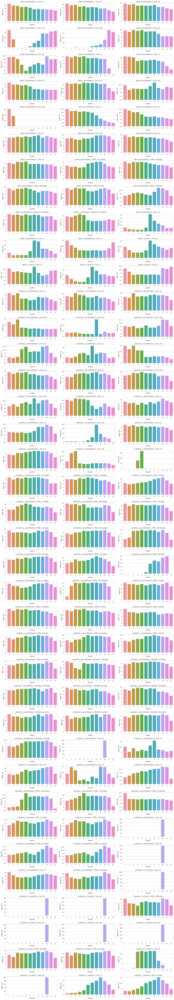

 
---------------------customer---------------------


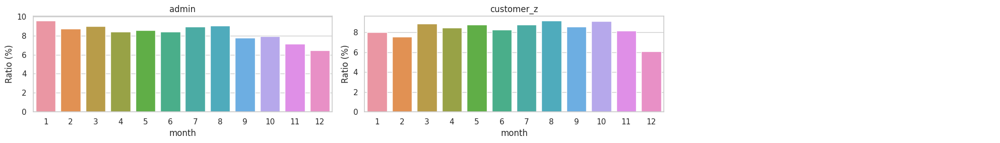

 
---------------------product_region---------------------


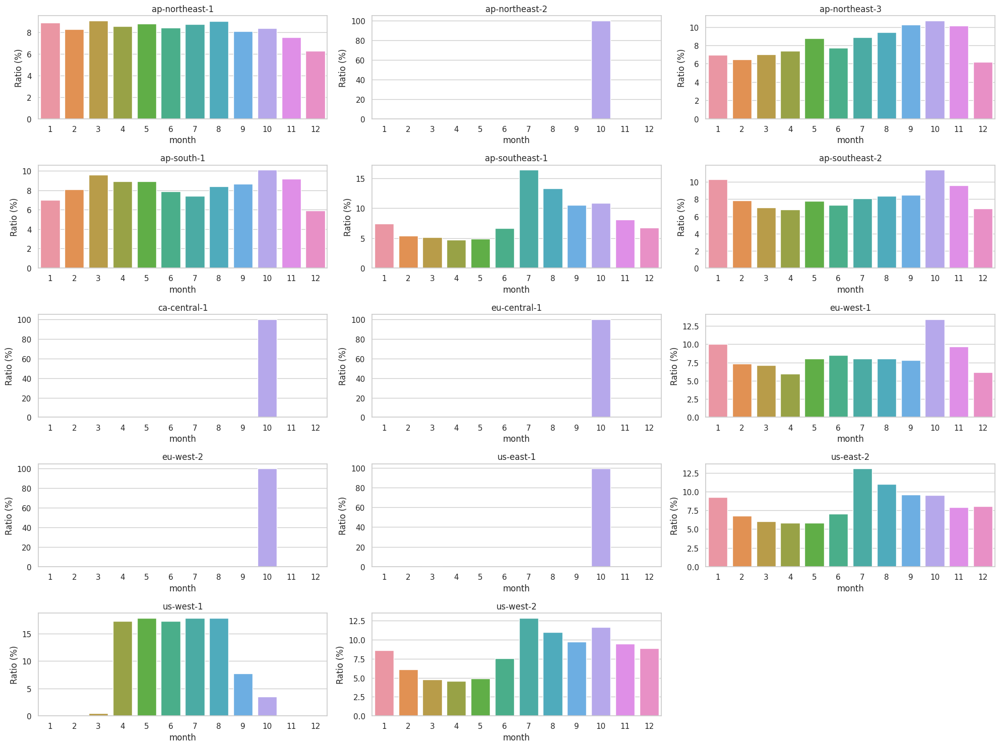

 
---------------------product_instanceType---------------------


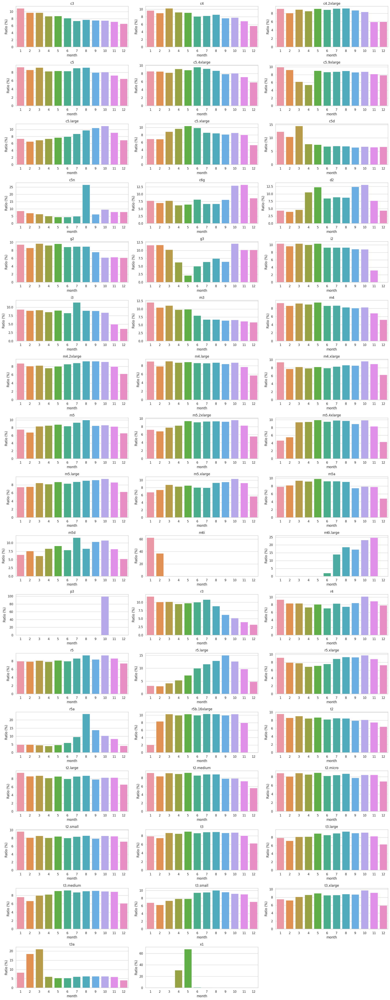

 
---------------------product_operatingSystem---------------------


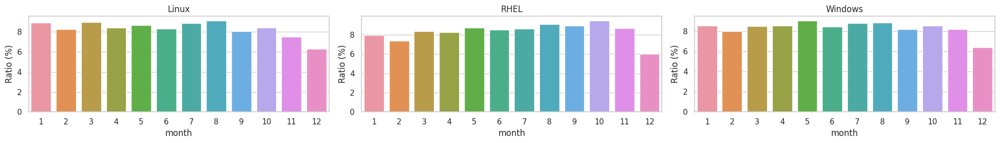

In [12]:
for column in columns:
    print(' ')
    print(f'---------------------{column}---------------------')
    plot_month_ratio(dfc,column)

## day毎

In [13]:
def plot_day_ratio(df, column):
    instance_column = df.groupby([column, 'day'])['total_sum_num_machine'].sum().reset_index()
    instance_sum = df.groupby(column)['total_sum_num_machine'].sum().reset_index()
    instance_column = instance_column.merge(instance_sum, on=column, suffixes=('', '_total'))
    instance_column['ratio'] = 100 * instance_column['total_sum_num_machine'] / instance_column['total_sum_num_machine_total']
    
    instances = instance_column[column].unique()
    n_rows = len(instances) // 3 + (len(instances) % 3 > 0)
    fig, axs = plt.subplots(n_rows, 3, figsize=(20, n_rows * 3), squeeze=False)

    for i, instance in enumerate(instances):
        row = i // 3
        col = i % 3
        ax = axs[row, col]

        instance_data = instance_column[instance_column[column] == instance]

        sns.barplot(x='day', y='ratio', data=instance_data, ax=ax)
        ax.set_title(instance)
        ax.set_xlabel('day')
        ax.set_ylabel('Ratio (%)')

    for i in range(len(instances), n_rows * 3):
        axs[i // 3, i % 3].axis('off')

    plt.tight_layout()
    plt.show()

 
---------------------instance---------------------


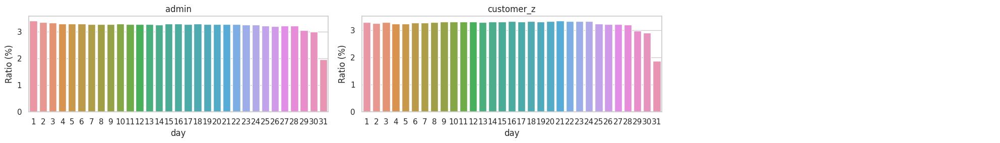

 
---------------------product_region---------------------


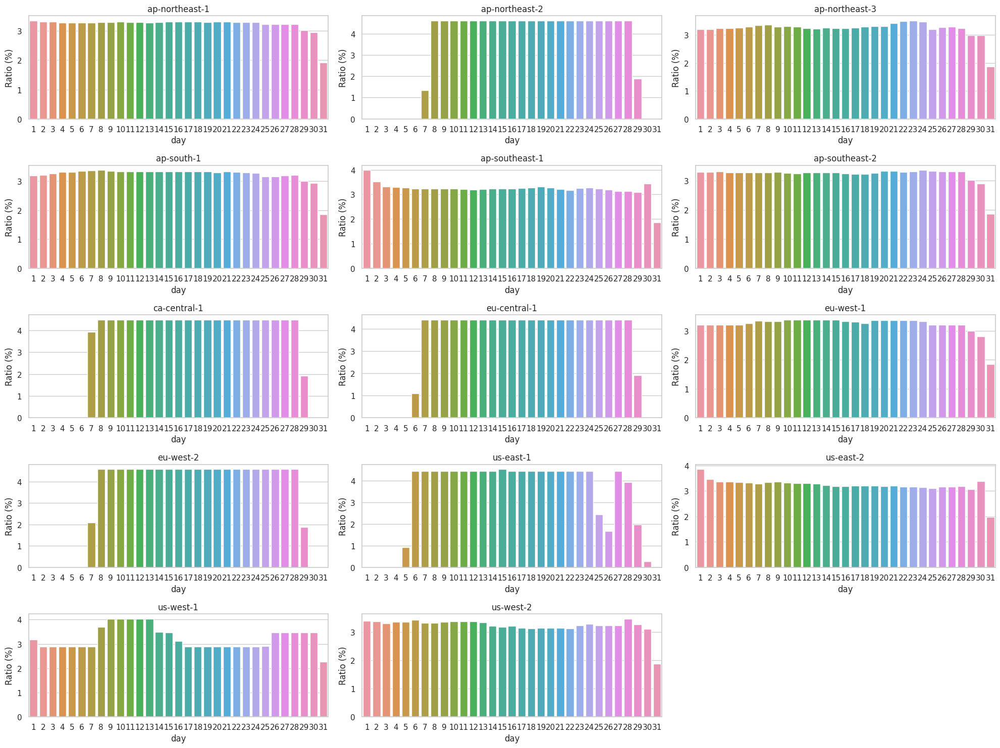

 
---------------------product_instanceType---------------------


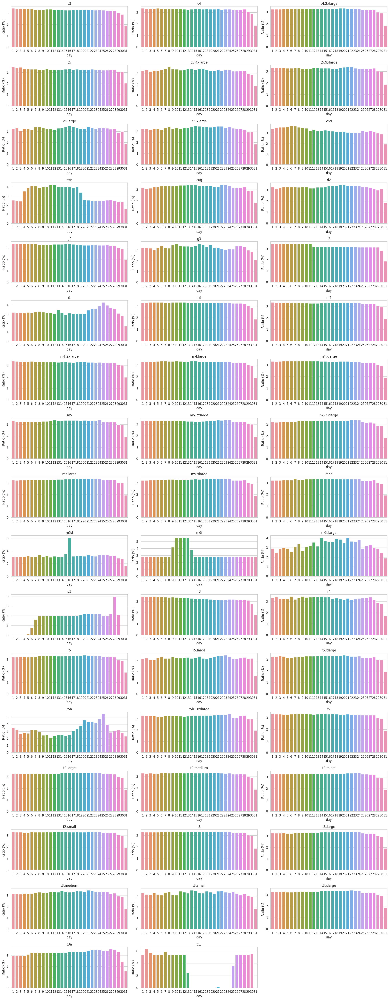

 
---------------------product_operatingSystem---------------------


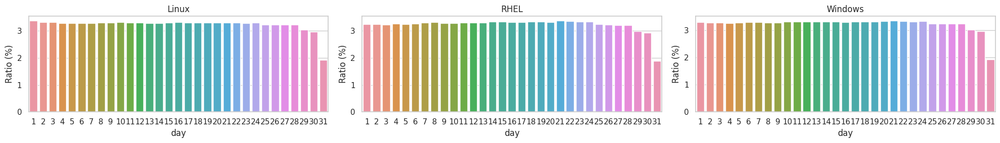

In [14]:
for column in columns:
    print(' ')
    print(f'---------------------{column}---------------------')
    plot_day_ratio(dfc,column)

# month-dayごと

In [15]:
def plot_monthday_ratio(df, column):
    instance_column = df.groupby([column, 'month-day'])['total_sum_num_machine'].sum().reset_index()
    instance_sum = df.groupby(column)['total_sum_num_machine'].sum().reset_index()
    instance_column = instance_column.merge(instance_sum, on=column, suffixes=('', '_total'))
    instance_column['ratio'] = 100 * instance_column['total_sum_num_machine'] / instance_column['total_sum_num_machine_total']
    
    instances = instance_column[column].unique()
    n_rows = len(instances) // 3 + (len(instances) % 3 > 0)
    fig, axs = plt.subplots(n_rows, 3, figsize=(20, n_rows * 3), squeeze=False)

    for i, instance in enumerate(instances):
        row = i // 3
        col = i % 3
        ax = axs[row, col]

        instance_data = instance_column[instance_column[column] == instance]

        sns.barplot(x='month-day', y='ratio', data=instance_data, ax=ax)
        ax.set_title(instance)
        ax.set_xlabel('month-day')
        ax.set_ylabel('Ratio (%)')

    for i in range(len(instances), n_rows * 3):
        axs[i // 3, i % 3].axis('off')

    plt.tight_layout()
    plt.show()

 
---------------------instance---------------------


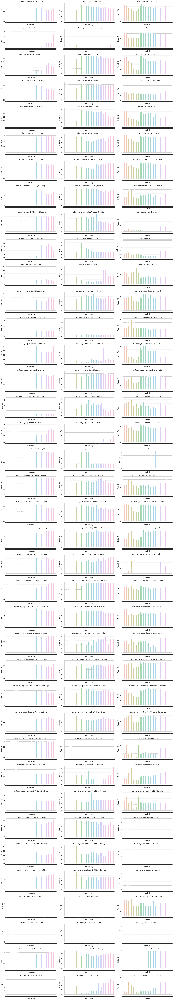

 
---------------------customer---------------------


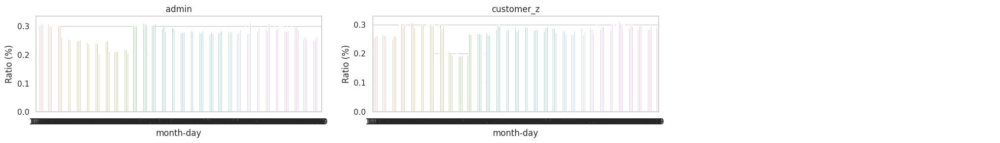

 
---------------------product_region---------------------


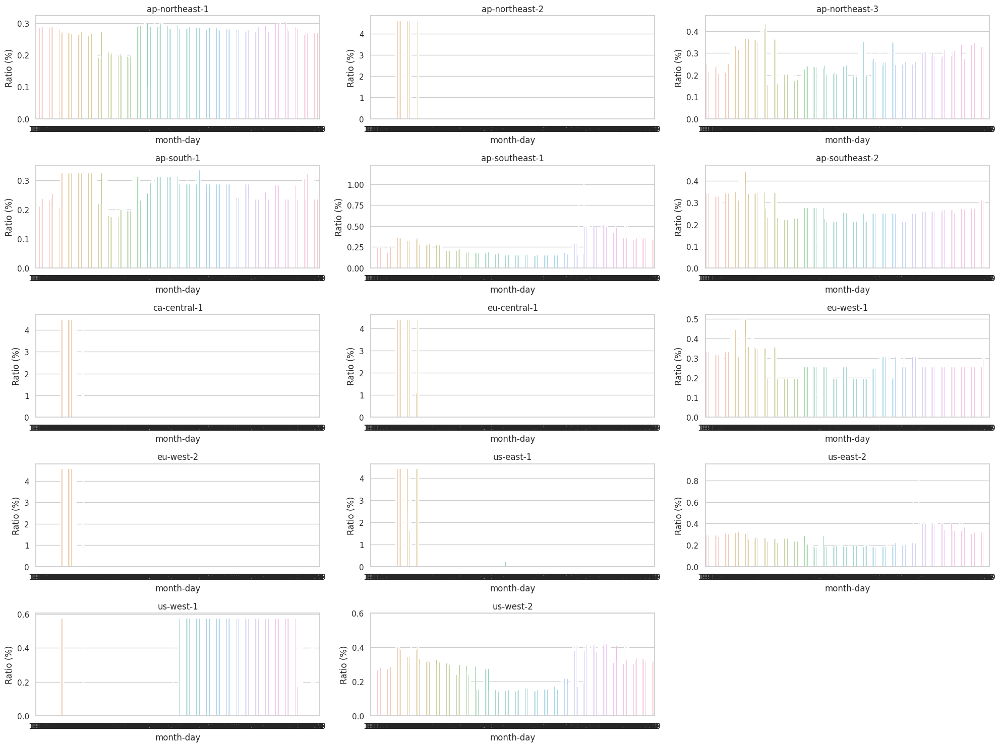

 
---------------------product_instanceType---------------------


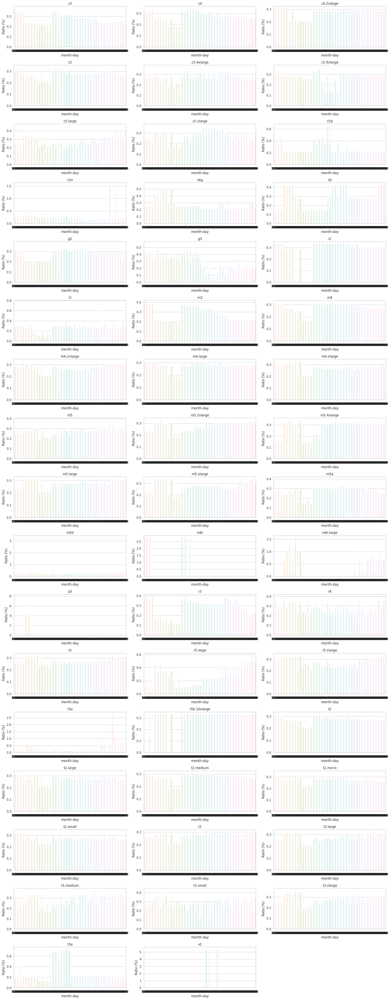

 
---------------------product_operatingSystem---------------------


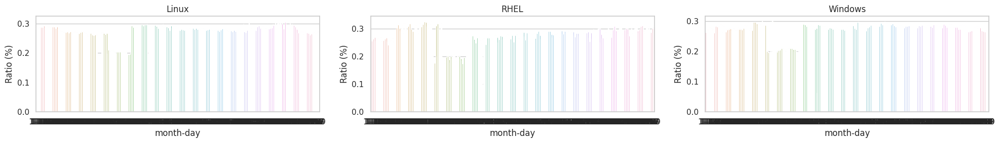

In [16]:
for column in columns:
    print(' ')
    print(f'---------------------{column}---------------------')
    plot_monthday_ratio(dfc,column)